##**Introduction to Supervised Learning on Graphs**

Notebook References:


1.Graph Machine Learning: Take graph data to the next level by applying machine learning techniques and algorithms https://github.com/PacktPublishing/Graph-Machine-Learning

2.Jure Leskovec, Stanford CS224W: Machine Learning with Graphs, http://cs224w.stanford.edu

3.Inductive settings of GraphSAGE, dgl implementation.
https://github.com/dmlc/dgl/pull/1741/files#diff-f94a94c19e905501ba4f5f52d653608cd7359ab05411862196b34600be51d5ea

4.Graph Classification - DGL implementation https://docs.dgl.ai/guide/training-graph.html?highlight=graph%20classification

5.https://discuss.dgl.ai/t/using-edge-features-for-gcn-in-dgl/427/4

6.https://github.com/dmlc/dgl/blob/master/examples/pytorch/gin/train.py

7.Training GNN for Edge Classification with Neighborhood Sampling, https://docs.dgl.ai/guide/minibatch-edge.html?highlight=edge%20classification

8.Graph Convolutional Networks (GCN), https://github.com/dmlc/dgl/tree/master/examples/tensorflow/gcn

##**Dependincies**

In [ ]:
!pip install karateclub
!pip install node2vec
!pip install dgl
!pip install networkx==2.8.4
!pip install adjustText

*Restart runtime

##**Graph Neural Networks (GNN)**

###**Graph Convolutional Networks**

####Transductive Node Classification

**In this section we will use the same example we used for unsupervised node classification, but here with supervised learning.**

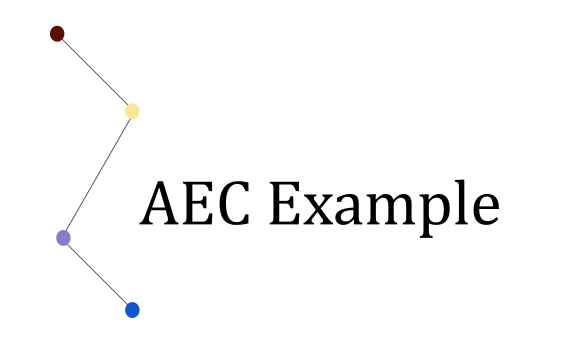

We can use the embeddings that have been obtained through unsupervised settings using dgi in a nodes classification downstream task. According to the authors, this can be done either in a transductive or inductive ways. We will do a **transductive learning**.

<font color='purple'>**The task is to complete a bubble diagram of hotel ground floor that have the most important zones labels, whereas other zones still have uncertainties about their labels(uses).**</font>




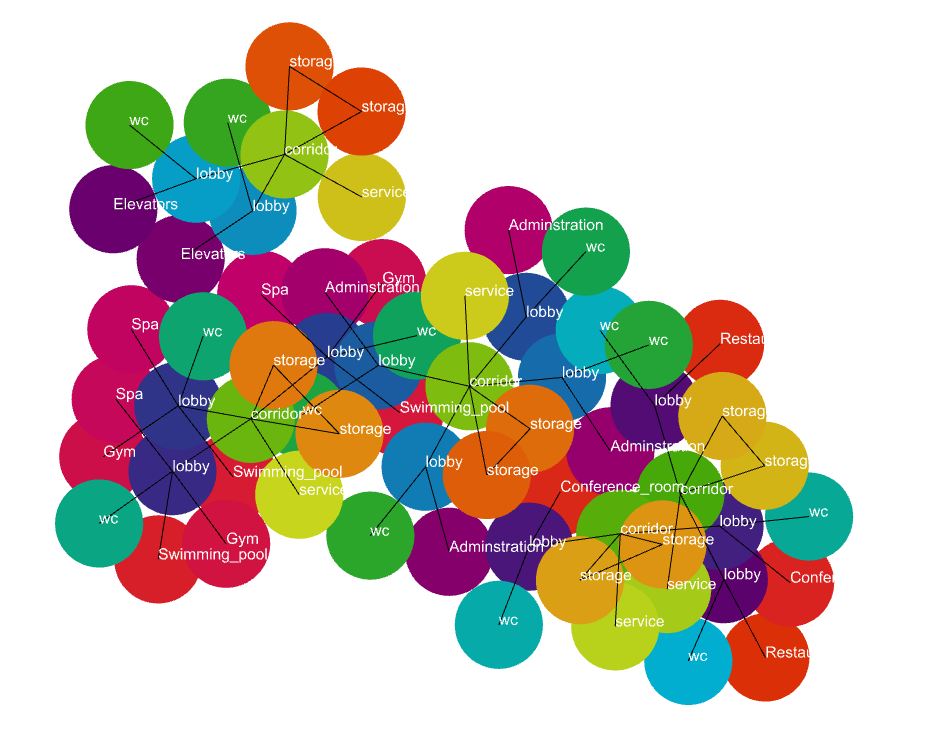

**Zoning rules**

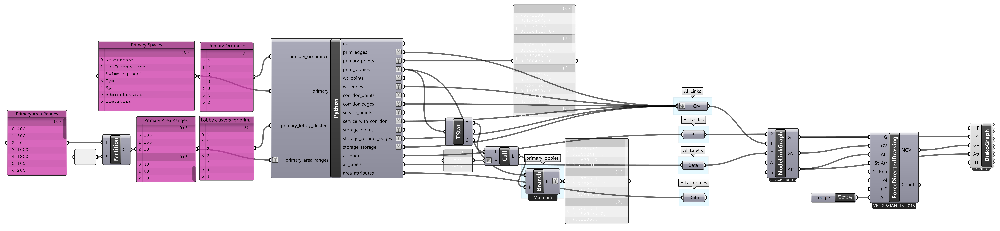

▶Lobbies always connect MINIMUM of 3 places,
including a main place(s), wc, a corridor that connects it to other lobbies of the same primary space type
(if there is only one lobby, the corridor will connect it with storages and service).

▶Primary spaces are :[Restaurant,Conferance room, Swimming pool, Gym, Spa, Adminstration, Elevators]

▶Each primary space is connected to a lobby that connects it with other secondary spaces.

▶Some primary spaces can be clusterd and connects to the same lobby (e.g. Swimming pool, Gym, Spa).


▶Services always have a degree of 1 that is  a corridor.

▶Storages always have a degree of 2 that includes another storage node with a corridor.

▶All corridors are connected together through a Main entrance lobby

▶This means corridors connect  at least 5 places(1lobbiey,2storages,1service, main entrance lobby).

▶All the main spaces have only a degree of one that is a lobby connection.

▶Notice also that either a main place or a wc always have a degree of one(lobby)
but the nodes features(e.g. area) are supposed to be different.

**This is just an illustrative example, not necessarily a correct zoning.*

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.manifold import TSNE
import os
os.environ['DGLBACKEND'] = "tensorflow"   #set tensorflow as the backend of dgl
import dgl
from dgl.nn import GraphConv
from adjustText import adjust_text
import math
from tensorflow.keras import layers
import time
from tqdm import tqdm
import copy
from collections import Counter
from __future__ import division
from __future__ import print_function
from dgl.nn import SAGEConv
import sklearn.linear_model as lm
import sklearn.metrics as skm
import itertools
import scipy.sparse as sp
import dgl.function as fn
from sklearn.metrics import roc_auc_score

#####**Load Graph data**

Import graph from grasshopper

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
labels_attributes=pd.read_csv("/content/drive/MyDrive/AIA23 - GraphML /Session_06/transductive_node_classification/graph_nodes.csv")
labels_attributes

,labels,area_attributes
0,Restaurant,480
1,Restaurant,420
2,Restaurant,480
3,Restaurant,460
4,Restaurant,400
...,...,...
191,storage,85
192,storage,86
193,storage,82
194,storage,89


In [ ]:
zoning_graph_edges=pd.read_csv("/content/drive/MyDrive/AIA23 - GraphML /Session_06/transductive_node_classification/graph_edges.csv")
zoning_graph_edges

,vi,vj
0,0,69
1,1,70
2,2,71
3,3,72
4,4,73
...,...,...
195,64,117
196,65,118
197,66,119
198,67,120


In [ ]:
#Create an edge list from the edges dataframe
zoning_graph_edges_list=[[zoning_graph_edges['vi'][i],zoning_graph_edges['vj'][i]] for i in range(zoning_graph_edges.shape[0])]

#Build the Graph
zoning_g=nx.Graph()
zoning_g.add_nodes_from(range(labels_attributes.shape[0]))
zoning_g.add_edges_from(zoning_graph_edges_list)

**Visualize the imported graph**

In [ ]:
counts=Counter(list(labels_attributes['labels']))
unique=list(counts) #unique labels, correct oeder
zoning_colors=[]
ColorLegend={}
for i in list(labels_attributes['labels']):
  for j in range(len(unique)):
    if i==unique[j]:
      c=range(len(unique))[j]
      ColorLegend[unique[j]]=c
  zoning_colors.append(c)
ColorLegend #check correct order

{'Restaurant': 0,
 'Conference_room': 1,
 'Swimming_pool': 2,
 'Gym': 3,
 'Spa': 4,
 'Adminstration': 5,
 'Elevators': 6,
 'lobby': 7,
 'wc': 8,
 'corridor': 9,
 'service': 10,
 'storage': 11,
 'main_entrance': 12}

In [ ]:
import matplotlib.colors as mcolors
zoning_colors_name=[]
for i in zoning_colors:
  zoning_colors_name.append(list(mcolors.CSS4_COLORS)[i+10]) #change i+number to get different colors (MAKE SURE TO KEEP IT THE SAME IN TEST VISUALIZATION)

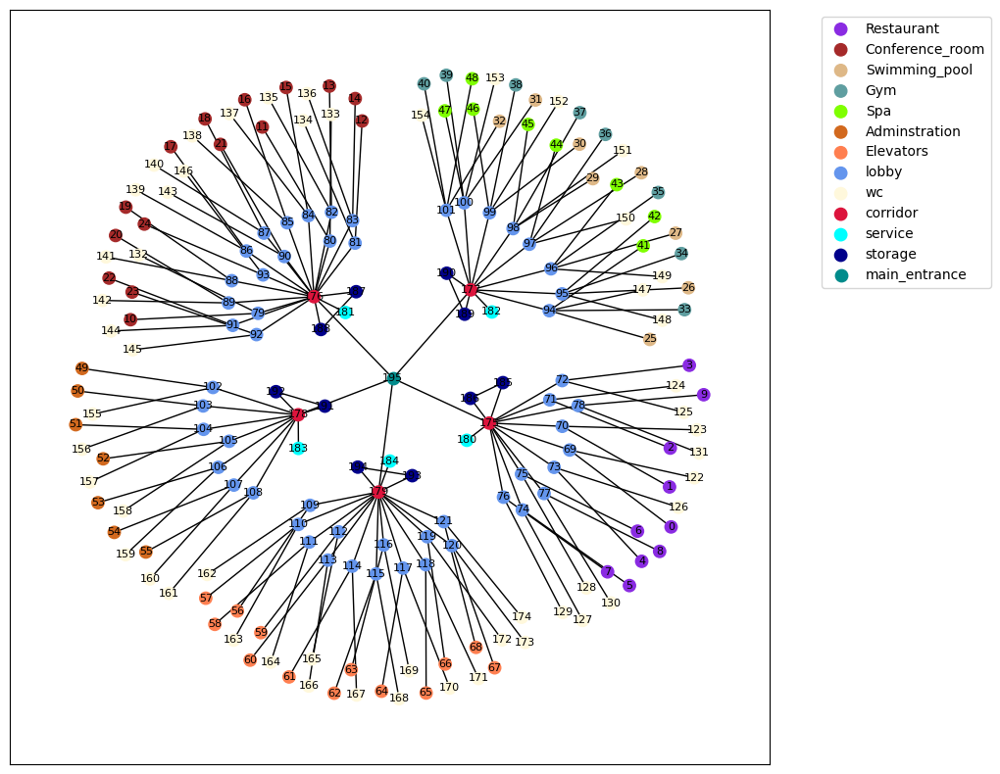

In [ ]:

fig = plt.figure(figsize=(10,10))

colors = zoning_colors

#Graph
ax = fig.add_subplot(1,1,1)
pos=nx.kamada_kawai_layout(zoning_g)
nx.draw_networkx(zoning_g,ax=ax,node_size=1,font_size=8,pos=pos) #simpler than getting the edge positions

#get inique indicies and extend the list to contains last index
labels_list=list(labels_attributes['labels'])
indexes = [labels_list.index(x) for x in set(labels_list)]
indexes.sort()
indexes.extend([len(labels_list)])
#For drawing nodes legend
for i in range(len(indexes)-1):
  a=indexes[i]
  z=indexes[i+1]
  nx.draw_networkx_nodes(zoning_g,pos=pos,nodelist=range(indexes[i],indexes[i+1]), ax=ax, node_color=zoning_colors_name[a:z],label=list(ColorLegend)[i],node_size=80)

ax.legend(loc=1, bbox_to_anchor=(1.3,1))


**Prepare the graph for learning**

Convert to dgl geaph

In [ ]:
g=dgl.from_networkx(zoning_g)
g.number_of_edges() #notice that number of edges has been doubled, this's because all graphs in dgl are directed,
#to consider an ubdirected grah, dgl added an extra edge in opposite direction between each connected pair of nodes

400

Add node labels

In [ ]:
g.ndata['label']=tf.convert_to_tensor(list(labels_attributes['labels']))

Add area as nodes features

In [ ]:
#convert the features to float
float_areas=[]

for a in list(labels_attributes['area_attributes']):
  float_areas.append(float(a))

float_areas=tf.convert_to_tensor(float_areas,dtype=float)

g.ndata['area']=float_areas

Add other structure based features (e.g. betweenness and node's degree)

In [ ]:
#degree centrality
float_degrees=[]
for a in g.out_degrees():
  float_degrees.append(float(a))

float_degrees=tf.convert_to_tensor(float_degrees,dtype=float)
g.ndata['degree']=float_degrees               #notice that this is the degrees of the original undirected grahp

#betweenness centrality
betweenness=nx.betweenness_centrality(zoning_g)
betweenness=[ list(betweenness.items())[i][1] for i in range(len(list(betweenness.items())))] #get the dictionary values not the keys
betweenness_centrality=tf.convert_to_tensor(betweenness,dtype=float)
g.ndata['betweenness']=betweenness_centrality

#closeness centrality
closeness=nx.closeness_centrality(zoning_g)
closeness=[ list(closeness.items())[i][1] for i in range(len(list(closeness.items())))] #get the dictionary values not the keys
closeness_centrality=tf.convert_to_tensor(closeness,dtype=float)
g.ndata['closeness']=closeness_centrality

#maximal clique centrality, (storages will have the largest cliques =3, since a pair forms loop with a corridor node)
cliques=nx.node_clique_number(zoning_g,zoning_g.nodes())
cliques=[ list(cliques.items())[i][1] for i in range(len(list(cliques.items())))] #get the dictionary values not the keys
cliques_centrality=tf.convert_to_tensor(cliques,dtype=float)
g.ndata['cliques']=cliques_centrality

#Harmonic centrality
harmonic=nx.harmonic_centrality(zoning_g)
harmonic=[ list(harmonic.items())[i][1] for i in range(len(list(harmonic.items())))] #get the dictionary values not the keys
harmonic_centrality=tf.convert_to_tensor(harmonic,dtype=float)
g.ndata['harmonic']=harmonic_centrality

In [ ]:
g

Graph(num_nodes=196, num_edges=400,
      ndata_schemes={'label': Scheme(shape=(), dtype=tf.string), 'area': Scheme(shape=(), dtype=tf.float32), 'degree': Scheme(shape=(), dtype=tf.float32), 'betweenness': Scheme(shape=(), dtype=tf.float32), 'closeness': Scheme(shape=(), dtype=tf.float32), 'cliques': Scheme(shape=(), dtype=tf.float32), 'harmonic': Scheme(shape=(), dtype=tf.float32)}
      edata_schemes={})

**Create training, validation and test maskes over the nodes**

Now we will create 3 masks over the nodes labels for the transductive training task. Here we will makes sure that all the main spaces labels are in the training mask, which means we will remove some labels from the other secondary spaces for validation and test masks.

We need to guarantee that all the labels types will be seen by the model in the training mask, this means we can't for example never introduce a 'storage' label to the model while being trained.

In [ ]:
#Spaces occurance in the dataset
z = list(labels_attributes['labels'])
counts=Counter(z)
list(counts.items())

[('Restaurant', 10),
 ('Conference_room', 15),
 ('Swimming_pool', 8),
 ('Gym', 8),
 ('Spa', 8),
 ('Adminstration', 7),
 ('Elevators', 13),
 ('lobby', 53),
 ('wc', 53),
 ('corridor', 5),
 ('service', 5),
 ('storage', 10),
 ('main_entrance', 1)]

In [ ]:
#Main spaces labels
Main_spaces=[b'Restaurant',b'Conference_room',b'Swimming_pool',b'Gym',b'Spa',b'Adminstration',b'Elevators',b'main_entrance']
#number of secondary spaces included in the train mask for each tupe
avilable_places=[35,30,2,2,4]           #[lobby,wc,corridor,service,storage]
Secondary_spaces=[b'lobby',b'wc',b'corridor',b'service',b'storage']

#train mask
train_mask=[0] * g.number_of_nodes()  #start with a list of zeros
iterator=0 #to avoid adding consecutive nodes from the same label
for i in g.nodes():
  if g.ndata['label'][i].numpy() in Main_spaces:
    train_mask[i.numpy()]=1                         #avoid removing main spaces from the train_mask
  #fill n number of the secondary spaces with 1, must includes all labels types, should have some randomness, avoid adding  all the nodes from one cluster of nodes, this harms the learning
  else:
    #previous_node_label='Anything'  #to avoid adding Consecutive Nodes
    for j in range(len(Secondary_spaces)):
      if g.ndata['label'][i].numpy()==Secondary_spaces[j] and avilable_places[j] != 0 and iterator%2 == 0 :
          train_mask[i.numpy()]=1
          avilable_places[j]=avilable_places[j]-1
          #print('space added')
      elif  g.ndata['label'][i].numpy()==Secondary_spaces[j] and avilable_places[j] != 0 and iterator%2 != 0:
        pass
        #print('skiped')

    iterator+=1

#check
#train_mask

Now we will create the validation then test masks, with keeping in mind that any (1) in the train mask has to be (0) in both masks.

We will initialize the validation mask by inverting the train mask, then randomly set 0 or 1 for the rest of non-zero (1) items between validation and test masks.

In [ ]:
validation_mask=[]
for i in range(len(train_mask)):
  if train_mask[i]==0:
    validation_mask.append(1)
  else:
    validation_mask.append(0)
#Let's now create both validation and test masks by either converting some (1) items to (0) in one mask and keeping them in the other mask
test_mask=[]
test_mask_2=[]
for i in range(len(validation_mask)):
  if validation_mask[i]==0: #1 items in test masks
    test_mask.append(0)
    test_mask_2.append(0)
  else:
    validation_mask[i]=random.randint(0, 1)
    if validation_mask[i] == 0:
      test_mask.append(1)
      test_mask_2.append(1)
    else:
      test_mask.append(0)
      test_mask_2.append(0)

**Visualize the three masks**

Text(0.5, 1.0, 'Test Mask')

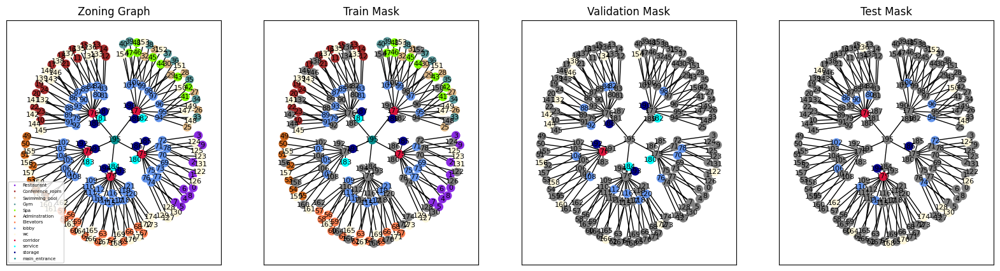

In [ ]:
fig = plt.figure(figsize=(20,5))

colors = zoning_colors

#Graph
ax = fig.add_subplot(1,4,1)
pos=nx.kamada_kawai_layout(zoning_g)
nx.draw_networkx(zoning_g,ax=ax,node_size=1,font_size=8,pos=pos) #simpler than getting the edge positions

#get inique indicies and extend the list to contains last index
labels_list=list(labels_attributes['labels'])
indexes = [labels_list.index(x) for x in set(labels_list)]
indexes.sort()
indexes.extend([len(labels_list)])
#For drawing nodes legend
for i in range(len(indexes)-1):
  a=indexes[i]
  z=indexes[i+1]
  nx.draw_networkx_nodes(zoning_g,pos=pos,nodelist=range(indexes[i],indexes[i+1]), ax=ax, node_color=zoning_colors_name[a:z],label=list(ColorLegend)[i],node_size=80)
ax.set_title('Zoning Graph')
ax.legend(loc=0,prop={'size':5},markerscale=.1)

#Train mask

train_zoning_colors_name = copy.deepcopy(zoning_colors_name)
for i in range(len(train_mask)):
  if train_mask[i] == 0:
    train_zoning_colors_name[i]='gray'

ax = fig.add_subplot(1,4,2)
nx.draw_networkx(zoning_g,ax=ax,node_size=1,font_size=8,pos=pos) #simpler than getting the edge positions
for i in range(len(indexes)-1):
  a=indexes[i]
  z=indexes[i+1]
  nx.draw_networkx_nodes(zoning_g,pos=pos,nodelist=range(indexes[i],indexes[i+1]), ax=ax, node_color=train_zoning_colors_name[a:z],label=list(ColorLegend)[i],node_size=80)
ax.set_title('Train Mask')
#ax.legend(loc=0,prop={'size':5},markerscale=.1)

#Validation mask

validation_zoning_colors_name = copy.deepcopy(zoning_colors_name)
for i in range(len(validation_mask)):
  if validation_mask[i] == 0:
    validation_zoning_colors_name[i]='gray'

ax = fig.add_subplot(1,4,3)
nx.draw_networkx(zoning_g,ax=ax,node_size=1,font_size=8,pos=pos) #simpler than getting the edge positions
for i in range(len(indexes)-1):
  a=indexes[i]
  z=indexes[i+1]
  nx.draw_networkx_nodes(zoning_g,pos=pos,nodelist=range(indexes[i],indexes[i+1]), ax=ax, node_color=validation_zoning_colors_name[a:z],label=list(ColorLegend)[i],node_size=80)
ax.set_title('Validation Mask')
#ax.legend(loc=0,prop={'size':5},markerscale=.1)

#Test mask

test_zoning_colors_name = copy.deepcopy(zoning_colors_name)
for i in range(len(test_mask)):
  if test_mask[i] == 0:
    test_zoning_colors_name[i]='gray'

ax = fig.add_subplot(1,4,4)
nx.draw_networkx(zoning_g,ax=ax,node_size=1,font_size=8,pos=pos) #simpler than getting the edge positions
for i in range(len(indexes)-1):
  a=indexes[i]
  z=indexes[i+1]
  nx.draw_networkx_nodes(zoning_g,pos=pos,nodelist=range(indexes[i],indexes[i+1]), ax=ax, node_color=test_zoning_colors_name[a:z],label=list(ColorLegend)[i],node_size=80)
ax.set_title('Test Mask')
#ax.legend(loc=0,prop={'size':5},markerscale=.1)

Please be aware that this may not be the best technique to create the masks, for larger graphs, **validation and test masks should be larger and more diverese in oreder to really validate the model accuracy**, in fact they can be larger than training mask. *check Cora dataset masks.*

Convert the three masks to tensorflow tensors

In [ ]:
for i in range(len(train_mask)):
  train_mask[i]=bool(train_mask[i])
  validation_mask[i]=bool(validation_mask[i])
  test_mask[i]=bool(test_mask[i])

train_mask=tf.convert_to_tensor(train_mask,dtype=bool)
validation_mask=tf.convert_to_tensor(validation_mask,dtype=bool)
test_mask=tf.convert_to_tensor(test_mask,dtype=bool)

Add to the graph

In [ ]:
g.ndata["train_mask"]=train_mask
g.ndata["val_mask"]=validation_mask
g.ndata["test_mask"]=test_mask

Add all nodes features in one tensor

In [ ]:
g.ndata["area"]=tf.reshape(g.ndata["area"],(g.ndata["area"].shape[0],1))
g.ndata["degree"]=tf.reshape(g.ndata["degree"],(g.ndata["degree"].shape[0],1))
g.ndata["betweenness"]=tf.reshape(g.ndata["betweenness"],(g.ndata["betweenness"].shape[0],1))
g.ndata["closeness"]=tf.reshape(g.ndata["closeness"],(g.ndata["closeness"].shape[0],1))
g.ndata["cliques"]=tf.reshape(g.ndata["cliques"],(g.ndata["cliques"].shape[0],1))
g.ndata["harmonic"]=tf.reshape(g.ndata["harmonic"],(g.ndata["harmonic"].shape[0],1))

g.ndata["feat"]=tf.concat([g.ndata["area"] , g.ndata["degree"] , g.ndata["betweenness"], g.ndata["closeness"],g.ndata["cliques"],g.ndata["harmonic"]  ],1)

In [ ]:
g.ndata["feat"].shape

TensorShape([196, 6])

Label encoding of classes

In [ ]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
le.fit(g.ndata["label"])
s=le.transform(g.ndata["label"])
encoded_classes=list(le.classes_)
s=tf.convert_to_tensor(s)
s

<tf.Tensor: shape=(196,), dtype=int64, numpy=
array([ 4,  4,  4,  4,  4,  4,  4,  4,  4,  4,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  6,  6,  6,  6,  6,  6,  6,  6,  3,
        3,  3,  3,  3,  3,  3,  3,  5,  5,  5,  5,  5,  5,  5,  5,  0,  0,
        0,  0,  0,  0,  0,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,  2,
        2,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12,
       12, 12, 12, 12, 12,  7,  7,  7,  7,  7, 10, 10, 10, 10, 10, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11,  9])>

In [ ]:
encoded_classes  #notice they are sorted alphabetically, don't have the same original order

[b'Adminstration',
 b'Conference_room',
 b'Elevators',
 b'Gym',
 b'Restaurant',
 b'Spa',
 b'Swimming_pool',
 b'corridor',
 b'lobby',
 b'main_entrance',
 b'service',
 b'storage',
 b'wc']

In [ ]:
ColorLegend #so for example, Resturant has an encoded class of '4' , and its color is '0'

{'Restaurant': 0,
 'Conference_room': 1,
 'Swimming_pool': 2,
 'Gym': 3,
 'Spa': 4,
 'Adminstration': 5,
 'Elevators': 6,
 'lobby': 7,
 'wc': 8,
 'corridor': 9,
 'service': 10,
 'storage': 11,
 'main_entrance': 12}

Correct the labels, so the class number is consistent with its color

In [ ]:
orderd_encodings= labels_attributes['labels'].apply(lambda x: list(ColorLegend).index(x))
orderd_encodings=tf.convert_to_tensor(orderd_encodings)
orderd_encodings

<tf.Tensor: shape=(196,), dtype=int64, numpy=
array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  2,  2,  2,  2,  2,  2,  2,  2,  3,
        3,  3,  3,  3,  3,  3,  3,  4,  4,  4,  4,  4,  4,  4,  4,  5,  5,
        5,  5,  5,  5,  5,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,  6,
        6,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,  7,
        7,  7,  7,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9, 10, 10, 10, 10, 10, 11, 11,
       11, 11, 11, 11, 11, 11, 11, 11, 12])>

In [ ]:
g.ndata["ordered_encoded_labels"]=orderd_encodings

#####**Learning**

**Define GCN Model**

In [ ]:
class GCN(tf.keras.Model):
    def __init__(self, g, in_feats, n_hidden, n_classes, n_layers, activation, dropout):
        super(GCN, self).__init__()
        self.g = g
        self.layer_list = []
        # input layer
        self.layer_list.append(GraphConv(in_feats, n_hidden, activation=activation))
        # hidden layers
        for i in range(n_layers - 1):
            self.layer_list.append(GraphConv(n_hidden, n_hidden, activation=activation))
        # output layer
        self.layer_list.append(GraphConv(n_hidden, n_classes))
        self.dropout = layers.Dropout(dropout)

    def call(self, features):
        h = features
        for i, layer in enumerate(self.layer_list):
            if i != 0:
                h = self.dropout(h)
            h = layer(self.g, h)
        return h

**Define Evaluation Function**

In [ ]:
def evaluate(model, features, labels, mask):
    logits = model(features, training=False)
    logits = logits[mask]
    labels = labels[mask]
    indices = tf.math.argmax(logits, axis=1)
    acc = tf.reduce_mean(tf.cast(indices == labels, dtype=tf.float32))
    return acc.numpy().item()

Hyperparametrs

In [ ]:
n_layers=1
dropout=0.0
n_hidden=16
lr=0.01
n_epochs=200
weight_decay=0
device='cpu'

In [ ]:

with tf.device(device):

  features = g.ndata["feat"]
  labels = g.ndata["ordered_encoded_labels"]
  train_mask = g.ndata["train_mask"]
  val_mask = g.ndata["val_mask"]
  test_mask = g.ndata["test_mask"]
  in_feats = features.shape[1]
  n_classes=len(encoded_classes)
  n_edges = g.number_of_edges()


  model = GCN(g,in_feats,n_hidden,n_classes,n_layers,tf.nn.relu,dropout)

  loss_fcn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
  # use optimizer
  optimizer = tf.keras.optimizers.Adam(learning_rate=lr, epsilon=1e-8)

  # initialize graph
  dur = []
  losses=[]
  val_acc=[]
  for epoch in range(n_epochs):
      if epoch >= 3:
          t0 = time.time()
      # forward
      with tf.GradientTape() as tape:
          logits = model(features)
          loss_value = loss_fcn(labels[train_mask], logits[train_mask])
          # Manually Weight Decay
          # We found Tensorflow has a different implementation on weight decay
          # of Adam(W) optimizer with PyTorch. And this results in worse results.
          # Manually adding weights to the loss to do weight decay solves this problem.
          for weight in model.trainable_weights:
              loss_value = loss_value + weight_decay * tf.nn.l2_loss(
                  weight
              )

          grads = tape.gradient(loss_value, model.trainable_weights)
          optimizer.apply_gradients(zip(grads, model.trainable_weights))
      if epoch >= 3:
          dur.append(time.time() - t0)

      acc = evaluate(model, features, labels, val_mask)
      print(
          "Epoch {:05d} | Time(s) {:.4f} | Loss {:.4f} | Accuracy {:.4f} | "
          "ETputs(KTEPS) {:.2f}".format(epoch,np.mean(dur),loss_value.numpy().item(),acc,n_edges / np.mean(dur) / 1000))
      losses.append(loss_value.numpy())
      val_acc.append(acc)
  acc = evaluate(model, features, labels, test_mask)
  print("Test Accuracy {:.4f}".format(acc))


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Epoch 00000 | Time(s) nan | Loss 60.7424 | Accuracy 0.0000 | ETputs(KTEPS) nan
Epoch 00001 | Time(s) nan | Loss 53.4270 | Accuracy 0.0000 | ETputs(KTEPS) nan
Epoch 00002 | Time(s) nan | Loss 46.6659 | Accuracy 0.0000 | ETputs(KTEPS) nan
Epoch 00003 | Time(s) 0.1122 | Loss 40.9953 | Accuracy 0.0000 | ETputs(KTEPS) 3.57
Epoch 00004 | Time(s) 0.1062 | Loss 36.5484 | Accuracy 0.0000 | ETputs(KTEPS) 3.77
Epoch 00005 | Time(s) 0.1280 | Loss 32.4323 | Accuracy 0.0000 | ETputs(KTEPS) 3.13
Epoch 00006 | Time(s) 0.1447 | Loss 28.3972 | Accuracy 0.0000 | ETputs(KTEPS) 2.76
Epoch 00007 | Time(s) 0.1396 | Loss 24.5536 | Accuracy 0.0286 | ETputs(KTEPS) 2.87
Epoch 00008 | Time(s) 0.1423 | Loss 21.0535 | Accuracy 0.0571 | ETputs(KTEPS) 2.81
Epoch 00009 | Time(s) 0.1463 | Loss 18.0800 | Accuracy 0.0571 | ETputs(KTEPS) 2.73
Epoch 00010 | Time(s) 0.1545 | Loss 16.1355 | Accuracy 0.0571 | ETputs(KTEPS) 2.59
Epoch 00011 | Time(s) 0.1507 | Loss 14.5730 | Accuracy 0.0571 | ETputs(KTEPS) 2.65
Epoch 00012 | Ti

#####**Evaluation**

**Training loss**

Text(0.5, 1.0, 'Training Loss')

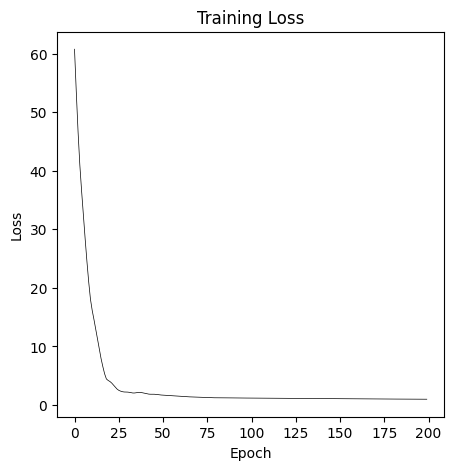

In [ ]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1)
plt.plot(range(len(losses)), losses, "k",linewidth=.5)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')

**Validation Accuracy**

Text(0.5, 1.0, 'Validation Accuracy')

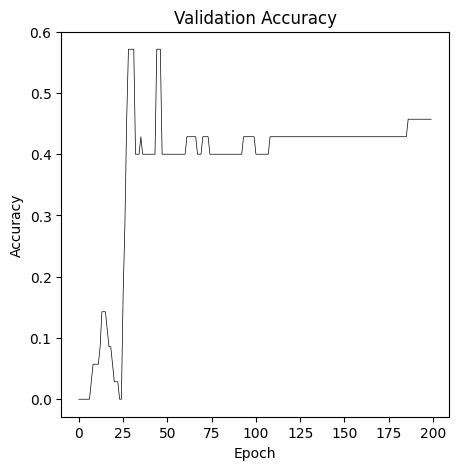

In [ ]:
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(1,1,1)
plt.plot(range(len(val_acc)), val_acc, "k",linewidth=.5)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')

**Test**

In [ ]:
test_acc = evaluate(model, features, labels, test_mask)
test_acc

0.4000000059604645

### comments from the lecture
Accuracy:  how many correct labels the model has predicted from the total number of labels

To improve accuracy, this model is not optimized, you will play with the hyperparameters

Another thing that impacts, also the output dimension of the embeddings vector for each node sometimes has a big effect on accuracy

###**GraphSAGE**

*restart runtime

####Inductive Node Classification

In the unsupervised learning class, we have seen how to preform a node classification task in a trensductive setting. This is not very helpful when we have a graph that keeps evolving, or we want to predict nodes classes in a different graph. We need to train the model to predict nodes it completely did not see their features before. Here comes the **Inductive Settings** of GNN.

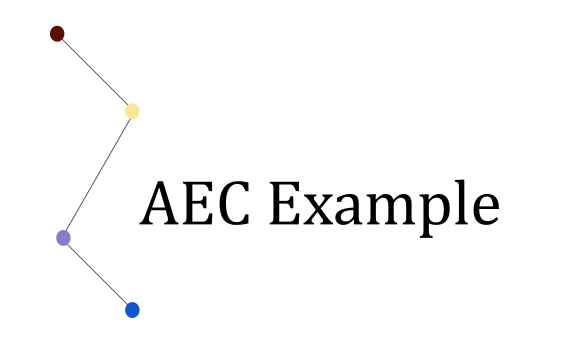

We will study the **average Daylight Factor (DF)** in each room in a tower, depending on the following parameters **per room**:
1. Context Height
2. Context Size
3. Context Distance
4. Window Size
5. Floor Number

This means each node will have a feature vector of length 5 to predict a label (DF)

The labels are abstracted to three classes, so each tower's room has a DF label either **(Bad - Moderate - Good)** depending on the mean of all the rooms in the tower.

The core node is given high values in terms of context height/size, 0 in context distance/window size/floor number. It gets a DF class of **Bad**.

In [ ]:
import networkx as nx
import random
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.manifold import TSNE
import dgl
from dgl.nn import GraphConv
import math
import time
from tqdm import tqdm
import copy
from collections import Counter
from __future__ import division
from __future__ import print_function
from dgl.nn import SAGEConv
import sklearn.linear_model as lm
import sklearn.metrics as skm
import itertools
import scipy.sparse as sp
import dgl.function as fn
from sklearn.metrics import roc_auc_score
import torch
import scipy.sparse as sp
import torch
import torch.nn as nn
import torch.nn.functional as F
import sklearn

#####**Load the graph**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [126]:
from os import walk
folder_path='/content/drive/MyDrive/GraphML_Satellite_Australia/CSVs_TEST/05'
paths = next(walk(folder_path), (None, None, []))[2]

In [127]:
from natsort import natsorted
paths=natsorted(paths)

In [128]:
paths

['1_edgelist.csv',
 '1_nodelist.csv',
 '2_edgelist.csv',
 '2_nodelist.csv',
 '3_edgelist.csv',
 '3_nodelist.csv',
 '4_edgelist.csv',
 '4_nodelist.csv',
 '5_edgelist.csv',
 '5_nodelist.csv',
 '6_edgelist.csv',
 '6_nodelist.csv',
 '7_edgelist.csv',
 '7_nodelist.csv',
 '8_edgelist.csv',
 '8_nodelist.csv',
 '9_edgelist.csv',
 '9_nodelist.csv',
 '10_edgelist.csv',
 '10_nodelist.csv',
 '11_edgelist.csv',
 '11_nodelist.csv',
 '12_edgelist.csv',
 '12_nodelist.csv',
 '13_edgelist.csv',
 '13_nodelist.csv',
 '14_edgelist.csv',
 '14_nodelist.csv',
 '15_edgelist.csv',
 '15_nodelist.csv',
 '16_edgelist.csv',
 '16_nodelist.csv',
 '17_edgelist.csv',
 '17_nodelist.csv',
 '18_edgelist.csv',
 '18_nodelist.csv',
 '19_edgelist.csv',
 '19_nodelist.csv',
 '20_edgelist.csv',
 '20_nodelist.csv',
 '21_edgelist.csv',
 '21_nodelist.csv',
 '22_edgelist.csv',
 '22_nodelist.csv',
 '23_edgelist.csv',
 '23_nodelist.csv',
 '24_edgelist.csv',
 '24_nodelist.csv',
 '25_edgelist.csv',
 '25_nodelist.csv',
 '26_edgelist.csv'

In [129]:
all_graphs_nodes=[]
all_graphs_edges=[]
for i in paths:
  if "nodelist.csv" in i:
    graphs_nodes=pd.read_csv(folder_path+'/'+i)
    all_graphs_nodes.append(graphs_nodes)
  elif "edgelist.csv" in i:
    graphs_edges=pd.read_csv(folder_path+'/'+i)
    all_graphs_edges.append(graphs_edges)

In [130]:
all_graphs_nodes[1]

,Node,weight,num_nodes,Betweenness,Degree,Closeness,Eigenvector,PageRank,Clustering
0,0,4.444444,1,0.000604,0.028169,0.101063,0.003349,0.006679,0.000000
1,1,3.750000,1,0.024145,0.042254,0.116352,0.008447,0.008943,0.333333
2,2,4.722222,1,0.003924,0.042254,0.112204,0.011264,0.007506,0.000000
3,3,4.583333,1,0.000805,0.042254,0.112620,0.009586,0.007311,0.666667
4,4,4.722222,2,0.076660,0.098592,0.132173,0.032996,0.015542,0.190476
...,...,...,...,...,...,...,...,...,...
67,67,3.650585,19,0.068813,0.098592,0.111713,0.004316,0.028691,0.238095
68,68,1.805556,1,0.000000,0.028169,0.094037,0.000973,0.008576,1.000000
69,69,3.611111,1,0.000000,0.028169,0.094037,0.000973,0.006702,1.000000
70,70,5.694444,1,0.000000,0.028169,0.095701,0.000684,0.007678,1.000000


In [131]:
all_graphs_edges[1]

,Node1,Node2,weight,Resistance
0,0,1,0.692308,1.444444
1,0,2,0.849057,1.177778
2,1,3,0.652174,1.533333
3,1,4,0.918367,1.088889
4,2,4,0.652174,1.533333
...,...,...,...,...
174,67,70,0.652174,1.533333
175,67,71,0.652174,1.533333
176,67,68,0.529412,1.888889
177,67,69,0.529412,1.888889


First let's label encode the DF_Label

Bad=0

Moderate=1

Good=2

In [132]:
from sklearn.preprocessing import MinMaxScaler

high_score = 4.5
low_score = 0.5

def average_neighbour_resistance(node, graph_edges):
    neighbours = graph_edges[(graph_edges['Node1'] == node) | (graph_edges['Node2'] == node)].values.flatten()
    neighbours = [x for x in neighbours if x != node]  # remove the node itself
    return graph_edges.loc[(graph_edges['Node1'].isin(neighbours) & (graph_edges['Node2'] == node)) |
                           (graph_edges['Node2'].isin(neighbours) & (graph_edges['Node1'] == node)), 'Resistance'].mean()

scaler = MinMaxScaler()
for g_nodes, g_edges in zip(all_graphs_nodes, all_graphs_edges):
    g_edges['Resistance'] = scaler.fit_transform(g_edges[['Resistance']])
    g_nodes['avg_neighbour_resistance'] = g_nodes['Node'].apply(lambda x: average_neighbour_resistance(x, g_edges))
    conditions = [
        (g_nodes['weight'] >= high_score),
        (g_nodes['weight'] <= low_score),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['avg_neighbour_resistance'] > 0.66),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['avg_neighbour_resistance'] <= 0.66) & (g_nodes['avg_neighbour_resistance'] > 0.33),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['avg_neighbour_resistance'] <= 0.33)
    ]
    labels = ['Wilderness', 'Rural', 'Borderland', 'Agroforestry', 'Farmland']
    g_nodes['Wilderness_Index'] = np.select(conditions, labels, default='UNKNOWN')
    label_mapping = {'Wilderness': 0, 'Rural': 0, 'Borderland': 1, 'Agroforestry': 2, 'Farmland': 3}
    g_nodes['encoded_label'] = g_nodes['Wilderness_Index'].map(label_mapping)


In [ ]:
from sklearn.preprocessing import MinMaxScaler

high_score = 4.5
low_score = 0.5

scaler = MinMaxScaler()
for g_nodes, g_edges in zip(all_graphs_nodes, all_graphs_edges):
    g_edges['Resistance'] = scaler.fit_transform(g_edges[['Resistance']])

    # normalize Betweenness values
    g_nodes['Betweenness'] = scaler.fit_transform(g_nodes[['Betweenness']])

    conditions = [
        (g_nodes['weight'] >= high_score),
        (g_nodes['weight'] <= low_score),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['Betweenness'] > 0.66),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['Betweenness'] <= 0.66) & (g_nodes['Betweenness'] > 0.33),
        (g_nodes['weight'] > low_score) & (g_nodes['weight'] < high_score) & (g_nodes['Betweenness'] <= 0.33)
    ]
    labels = ['Wilderness', 'Rural', 'Borderland', 'Agroforestry', 'Farmland']
    g_nodes['Wilderness_Index'] = np.select(conditions, labels, default='UNKNOWN')
    label_mapping = {'Wilderness': 0, 'Rural': 0, 'Borderland': 1, 'Agroforestry': 2, 'Farmland': 3}
    g_nodes['encoded_label'] = g_nodes['Wilderness_Index'].map(label_mapping)


In [133]:
print(all_graphs_nodes[4]['encoded_label'].value_counts())


0    97
3    49
2    14
1     1
Name: encoded_label, dtype: int64


In [134]:
for i in range(len(all_graphs_nodes)):
    if 'Eigenvector' in all_graphs_nodes[i].columns:  # check if the column exists
        all_graphs_nodes[i] = all_graphs_nodes[i].drop(['Eigenvector'], axis=1)


In [ ]:
all_graphs_nodes[56]

In [ ]:
#check
all_graphs_edges[1]

In [135]:
all_edited_weights=[]
for  e_csv in all_graphs_edges:
  sub_ew=[]
  for j in range(len(e_csv["weight"])):
    e_w=e_csv["weight"].iloc[j] /2 +   e_csv["Resistance"].iloc[j] /2
    sub_ew.append(e_w)
  all_edited_weights.append(sub_ew)


In [136]:
for e_csv,e_w in zip(all_graphs_edges,all_edited_weights):
  e_csv['new_weight'] = e_w

In [ ]:
all_graphs_edges[1]

In [137]:
print(all_graphs_nodes[1]['encoded_label'].value_counts())
#very high add it to 0


0    52
3    12
2     8
Name: encoded_label, dtype: int64


In [ ]:
def check_nan_values(all_graphs):
    for i, g in enumerate(all_graphs):
        print(f"Graph {i+1}")
        print(g.isnull().sum())

print("Checking NaN values in node dataframes:")
check_nan_values(all_graphs_nodes)

print("\nChecking NaN values in edge dataframes:")
check_nan_values(all_graphs_edges)


**Build the graphs**

In [138]:
#Create an edge list for each graph from the edges dataframe
graphs_edge_lists=[]
for graph_edges in all_graphs_edges:
  graph_edges_list=[[graph_edges['Node1'][i], graph_edges['Node2'][i]] for i in range(graph_edges.shape[0])]
  graphs_edge_lists.append(graph_edges_list)

#Build the Graphs
tower_graphs=[]
for i,j in zip(graphs_edge_lists,all_graphs_nodes):
  tower_g=nx.Graph()
  tower_g.add_nodes_from(range(j.shape[0]))
  tower_g.add_edges_from(i)
  tower_graphs.append(tower_g)

#Add nodes features (create dictionaries)
for graph_nodes,graph in zip(all_graphs_nodes,tower_graphs):
  nx.set_node_attributes(graph,graph_nodes['weight'] ,'weight')
  nx.set_node_attributes(graph,graph_nodes['num_nodes'] ,'num_nodes')
  nx.set_node_attributes(graph,graph_nodes['Betweenness'] ,'Betweenness')
  nx.set_node_attributes(graph,graph_nodes['Degree'] ,'Degree')
  nx.set_node_attributes(graph,graph_nodes['Closeness'] ,'Closeness')
  #nx.set_node_attributes(graph,graph_nodes['Eigenvector'] ,'Eigenvector')
  nx.set_node_attributes(graph,graph_nodes['PageRank'] ,'PageRank')
  nx.set_node_attributes(graph,graph_nodes['Clustering'] ,'Clustering')
  nx.set_node_attributes(graph,graph_nodes['avg_neighbour_resistance'] ,'avg_neighbour_resistance')
  nx.set_node_attributes(graph,graph_nodes['Wilderness_Index'] ,'Wilderness_Index')
  nx.set_node_attributes(graph,graph_nodes['encoded_label'] ,'encoded_label')



# Add edges features (create dictionaries)
new_tower_graphs=[]
for graph_edges,graph in zip(all_graphs_edges,tower_graphs):
  #edge_weights = {(row['Node1'], row['Node2']): row['weight'] for _, row in graph_edges.iterrows()}
  #edge_resistances = {(row['Node1'], row['Node2']): row['Resistance'] for _, row in graph_edges.iterrows()}
  #edge_new_weights = {(row['Node1'], row['Node2']): row['new_weight'] for _, row in graph_edges.iterrows()}

  edge_new_weights={}
  for i,j in zip(graph.edges(),graph_edges["new_weight"]):
    edge_new_weights[i]=j

  #print(edge_new_weights)
  #nx.set_edge_attributes(graph, edge_weights, 'weight')
  #nx.set_edge_attributes(graph, edge_resistances, 'Resistance')
  nx.set_edge_attributes(graph, edge_new_weights, 'new_weight')
  graph=graph.to_directed()
  new_tower_graphs.append(graph)

#check

#nx.get_edge_attributes(tower_graphs[20],'new_weight')



In [139]:
tower_graphs=new_tower_graphs

In [102]:
nx.get_edge_attributes(tower_graphs[26],  'new_weight')

{(0, 1): 0.3821252638986629,
 (1, 0): 0.3821252638986629,
 (1, 12): 0.37629848177515524,
 (1, 13): 0.40938856518185973,
 (2, 25): 0.3825587206396801,
 (2, 4): 0.3825587206396801,
 (2, 5): 0.39689059417034234,
 (3, 25): 0.37629848177515524,
 (3, 28): 0.3754215706517998,
 (3, 5): 0.385580480690492,
 (3, 17): 0.37886570091671445,
 (4, 2): 0.3825587206396801,
 (4, 5): 0.42101212345928696,
 (4, 6): 0.37786944164177233,
 (5, 2): 0.39689059417034234,
 (5, 3): 0.385580480690492,
 (5, 4): 0.42101212345928696,
 (5, 6): 0.3889990204091096,
 (5, 16): 0.3799733522035433,
 (5, 7): 0.4710450879312339,
 (5, 8): 0.3753195798896609,
 (6, 4): 0.37786944164177233,
 (6, 5): 0.3889990204091096,
 (6, 8): 0.39999094940718616,
 (6, 16): 0.4352776882586744,
 (7, 5): 0.4710450879312339,
 (7, 9): 0.40938856518185973,
 (8, 5): 0.3753195798896609,
 (8, 6): 0.39999094940718616,
 (8, 9): 0.37786944164177233,
 (8, 16): 0.4352776882586743,
 (9, 7): 0.40938856518185973,
 (9, 8): 0.37786944164177233,
 (9, 16): 0.37500091

**Visualize the 3D graph**

**All the graphs**

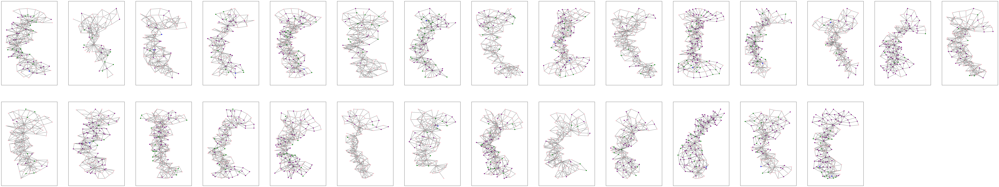

In [140]:
fig = plt.figure(figsize=(100,100))

g_ind = 1
for i, g in zip(all_graphs_nodes, tower_graphs):
    colors_name = []
    for j in i['encoded_label']:
        if j == 0:  # Wilderness and Rural
            colors_name.append('pink')
        elif j == 1:  # Borderland
            colors_name.append('blue')
        elif j == 2:  # Agroforestry
            colors_name.append('green')
        elif j == 3:  # Farmland
            colors_name.append('purple')  # Choose a color for Farmland, I've chosen yellow here

    ax = fig.add_subplot(10, 15,g_ind)
    positions=nx.kamada_kawai_layout(g)
    nx.draw_networkx(g,pos=positions,node_color=colors_name,node_size=20,with_labels=False, arrowsize=2, edge_color='grey')

    g_ind += 1


▶ Notice that dataset in general should have **more variety** in terms of number of floors and other parameters, this is just an example

---

**Split the graphs list to Train / Validation/ Test**

In [103]:
import random

total_graphs = len(tower_graphs)

# define percentages
train_percent = 0.7
valid_percent = 0.15

# calculate quantities
k_train = int(total_graphs * train_percent)
k_valid = int(total_graphs * valid_percent)

# sample for train and validation
train_graphs = random.sample(tower_graphs, k=k_train)
remaining_graphs = [i for i in tower_graphs if i not in train_graphs]

validation_graphs = random.sample(remaining_graphs, k=k_valid)

# rest goes to testing
test_graphs = [i for i in remaining_graphs if i not in validation_graphs]

print(f'Number of train graphs = { len(train_graphs)}' )
print(f'Number of valid graphs = { len(validation_graphs)}' )
print(f'Number of test graphs = { len(test_graphs)}' )


Number of train graphs = 602
Number of valid graphs = 129
Number of test graphs = 129


**Union all graphs in one graph (with relabling the nodes)**

In [104]:
train_G=nx.disjoint_union_all(train_graphs)
print(train_G.number_of_edges())

test_G=nx.disjoint_union_all(test_graphs)

validation_G=nx.disjoint_union_all(validation_graphs)

439652


In [105]:
tower_graphs[0]

In [106]:
train_graphs[0]

**Check that the nodes order is preserved in the joined graph**

In [107]:
print(train_graphs[1].number_of_nodes())     #number of nodes in the first graph
nx.get_node_attributes(train_graphs[1],'weight')  #check, this is the second graph in the list , and its nodes must be after the nodes of the first graph in the union graph

130


{0: 0.4,
 1: 2.6666666666666665,
 2: 2.533333333333333,
 3: 3.6,
 4: 2.1333333333333333,
 5: 3.733333333333333,
 6: 4.0,
 7: 3.2,
 8: 2.6666666666666665,
 9: 1.8666666666666667,
 10: 1.4666666666666666,
 11: 5.066666666666666,
 12: 5.6,
 13: 3.6,
 14: 3.208888888888888,
 15: 3.2,
 16: 3.8,
 17: 5.6,
 18: 1.8666666666666667,
 19: 2.1777777777777776,
 20: 3.0666666666666664,
 21: 2.1333333333333333,
 22: 3.2333333333333334,
 23: 3.009523809523809,
 24: 3.6,
 25: 2.2666666666666666,
 26: 3.7684210526315782,
 27: 6.533333333333333,
 28: 8.8,
 29: 3.972549019607844,
 30: 0.5333333333333333,
 31: 2.6666666666666665,
 32: 4.096969696969697,
 33: 4.416666666666667,
 34: 1.6,
 35: 3.6,
 36: 3.911111111111111,
 37: 6.266666666666667,
 38: 2.955555555555556,
 39: 4.586666666666667,
 40: 2.6666666666666665,
 41: 3.6,
 42: 4.0,
 43: 5.066666666666666,
 44: 7.066666666666666,
 45: 4.0,
 46: 3.422222222222222,
 47: 3.1111111111111107,
 48: 5.333333333333333,
 49: 2.8000000000000003,
 50: 4.0666666666

In [108]:
nx.get_node_attributes(train_G,'weight')
#nx.number_of_nodes(train_G)

{0: 9.23076923076923,
 1: 8.632478632478632,
 2: 5.897435897435897,
 3: 5.384615384615384,
 4: 6.9230769230769225,
 5: 3.846153846153846,
 6: 9.17948717948718,
 7: 5.589743589743589,
 8: 9.17948717948718,
 9: 8.923076923076923,
 10: 10.0,
 11: 7.435897435897436,
 12: 6.9230769230769225,
 13: 4.102564102564102,
 14: 7.435897435897435,
 15: 5.5,
 16: 6.41025641025641,
 17: 6.897435897435897,
 18: 7.384615384615384,
 19: 5.205128205128204,
 20: 8.23076923076923,
 21: 6.362179487179487,
 22: 9.948717948717947,
 23: 6.871794871794871,
 24: 4.564102564102564,
 25: 6.871794871794871,
 26: 6.205128205128204,
 27: 5.504273504273503,
 28: 5.333333333333333,
 29: 2.9743589743589745,
 30: 5.128205128205128,
 31: 7.897435897435897,
 32: 5.6410256410256405,
 33: 6.179487179487179,
 34: 8.923076923076923,
 35: 4.82051282051282,
 36: 5.198717948717948,
 37: 8.564102564102564,
 38: 6.358974358974359,
 39: 9.435897435897434,
 40: 6.635897435897436,
 41: 7.64102564102564,
 42: 3.282051282051282,
 43: 7.6

**Visualize each set of graphs (Training , Test, Validation)**

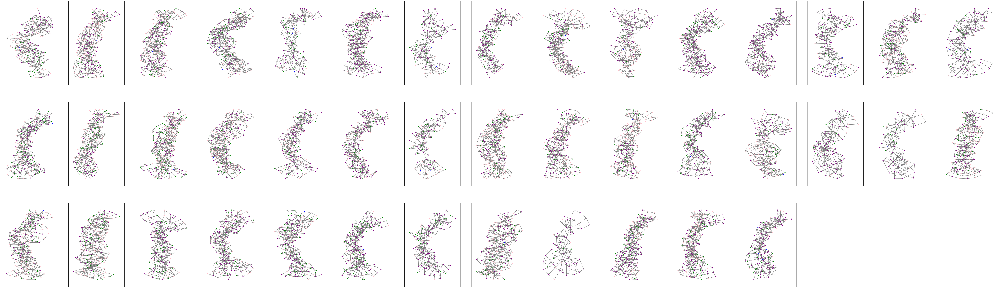

In [22]:
fig = plt.figure(figsize=(100,100))

g_ind = 1
for g in (train_graphs):
  colors_name = []

  for j in nx.get_node_attributes(g,'encoded_label').values():
    if j == 0:  # Wilderness and Rural
      colors_name.append('pink')
    elif j == 1:  # Borderland
      colors_name.append('blue')
    elif j == 2:  # Agroforestry
      colors_name.append('green')
    elif j == 3:  # Farmland
      colors_name.append('purple')

  ax = fig.add_subplot(10, 15, g_ind)
  positions = nx.kamada_kawai_layout(g)
  nx.draw_networkx(g, pos=positions, node_color=colors_name, node_size=20, with_labels=False, arrowsize=2, edge_color='grey')  # Make arrows smaller and edges grey

  g_ind += 1


In [ ]:
Counter(nx.get_node_attributes(g,'encoded_label').values())

Counter({0: 109, 3: 63, 2: 33, 1: 1})

---

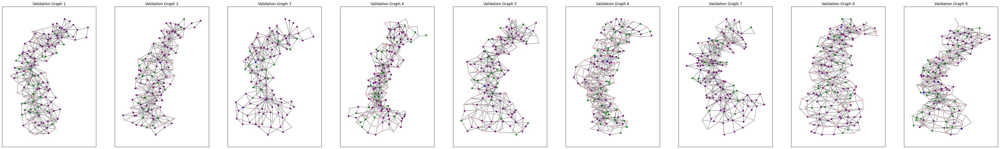

In [23]:
# Validation Graphs
fig = plt.figure(figsize=(100,100))

g_ind = 1
for g in (validation_graphs):
  colors_name = []

  for j in nx.get_node_attributes(g,'encoded_label').values():
    if j == 0:  # Wilderness and Rural
      colors_name.append('pink')
    elif j == 1:  # Borderland
      colors_name.append('blue')
    elif j == 2:  # Agroforestry
      colors_name.append('green')
    elif j == 3:  # Farmland
      colors_name.append('purple')

  ax = fig.add_subplot(10, 15, g_ind)
  positions = nx.kamada_kawai_layout(g)
  nx.draw_networkx(g, pos=positions, node_color=colors_name, node_size=20, with_labels=False, arrowsize=2, edge_color='grey')  # Make arrows smaller and edges grey
  ax.set_title(f'Validation Graph {g_ind}')

  g_ind += 1


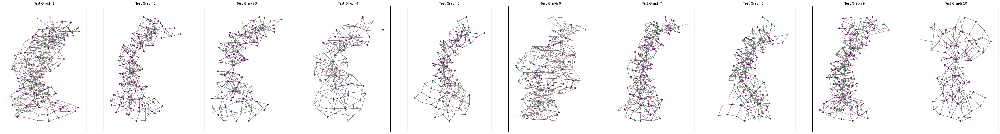

In [24]:
# Test Graphs
fig = plt.figure(figsize=(100,100))

g_ind = 1
for g in (test_graphs):
  colors_name = []

  for j in nx.get_node_attributes(g,'encoded_label').values():
    if j == 0:  # Wilderness and Rural
      colors_name.append('pink')
    elif j == 1:  # Borderland
      colors_name.append('blue')
    elif j == 2:  # Agroforestry
      colors_name.append('green')
    elif j == 3:  # Farmland
      colors_name.append('purple')

  ax = fig.add_subplot(10, 15, g_ind)
  positions = nx.kamada_kawai_layout(g)
  nx.draw_networkx(g, pos=positions, node_color=colors_name, node_size=20, with_labels=False, arrowsize=2, edge_color='grey')  # Make arrows smaller and edges grey
  ax.set_title(f'Test Graph {g_ind}')

  g_ind += 1


▶ Please notice that the graphs are named in each set of the 3 (Train/Validtion/Test) only for visualization, but in fact each set is only one graph contains all these numbered graphs shown above.

**Convert to a dgl graph**

In [109]:
# Conversion for the training graph
train_G_dgl = dgl.from_networkx(
    train_G,
    node_attrs=['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance', 'encoded_label'],
    edge_attrs=['new_weight'])

# Conversion for the test graph
test_G_dgl = dgl.from_networkx(
    test_G,
    node_attrs=['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance', 'encoded_label'],
    edge_attrs=['new_weight'])



# Conversion for the validation graph
validation_G_dgl = dgl.from_networkx(
    validation_G,
    node_attrs=['weight', 'num_nodes', 'Betweenness', 'Degree', 'Closeness', 'PageRank', 'Clustering', 'avg_neighbour_resistance', 'encoded_label'],
    edge_attrs=['new_weight'])


In [110]:
for node in train_G.nodes(data=True):
    if 'weight' not in node[1]:  # node[1] is the attribute dictionary
        print(f"Node {node[0]} does not have 'weight' attribute")

---

**Combine all nodes features in one tensor**

In [111]:
# Attribute list
attributes = ["weight", "num_nodes", "Betweenness", "Degree", "Closeness", "PageRank","avg_neighbour_resistance", "Clustering"]

# For the training graph
for attr in attributes:
    train_G_dgl.ndata[attr] = torch.reshape(train_G_dgl.ndata[attr], (train_G_dgl.ndata[attr].shape[0], 1))

# Concatenate to form the feature vector
train_G_dgl.ndata["feat"] = torch.cat([train_G_dgl.ndata[attr] for attr in attributes], 1)
print(train_G_dgl.ndata["feat"].shape)

# For the testing graph
for attr in attributes:
    test_G_dgl.ndata[attr] = torch.reshape(test_G_dgl.ndata[attr], (test_G_dgl.ndata[attr].shape[0], 1))

# Concatenate to form the feature vector
test_G_dgl.ndata["feat"] = torch.cat([test_G_dgl.ndata[attr] for attr in attributes], 1)
print(test_G_dgl.ndata["feat"].shape)

# For the validation graph
for attr in attributes:
    validation_G_dgl.ndata[attr] = torch.reshape(validation_G_dgl.ndata[attr], (validation_G_dgl.ndata[attr].shape[0], 1))

# Concatenate to form the feature vector
validation_G_dgl.ndata["feat"] = torch.cat([validation_G_dgl.ndata[attr] for attr in attributes], 1)
print(validation_G_dgl.ndata["feat"].shape)


torch.Size([82471, 8])
torch.Size([17239, 8])
torch.Size([17874, 8])


In [112]:
train_G_dgl.edata['new_weight']

tensor([0.4639, 0.4639, 0.4417,  ..., 0.4208, 0.4208, 0.4208])

In [113]:
train_G_dgl.ndata["feat"]=train_G_dgl.ndata["feat"].type(torch.float32)
validation_G_dgl.ndata["feat"]=validation_G_dgl.ndata["feat"].type(torch.float32)
test_G_dgl.ndata["feat"]=test_G_dgl.ndata["feat"].type(torch.float32)

#####**Learning**

**Define GraphSAGE model**

In [114]:
class SAGE(nn.Module):
    def __init__(self, in_feats, hid_feats, out_feats):
        super().__init__()
        self.conv1 = SAGEConv(in_feats=in_feats, out_feats=hid_feats, aggregator_type='mean')
        self.conv2 = SAGEConv(in_feats=hid_feats, out_feats=out_feats, aggregator_type='mean')

    def forward(self, graph, inputs,edge_weights):
        # inputs are features of nodes
        h = self.conv1(graph, inputs)
        h = F.relu(h)
        h = self.conv2(graph, h)
        return h

**Get the features and labels tensors**

In [115]:
train_node_features = train_G_dgl.ndata['feat']
train_node_labels = train_G_dgl.ndata['encoded_label']

validation_node_features = validation_G_dgl.ndata['feat']
validation_node_labels = validation_G_dgl.ndata['encoded_label']

test_node_features = test_G_dgl.ndata['feat']
test_node_labels = test_G_dgl.ndata['encoded_label']

n_features = train_node_features.shape[1]
n_labels = int(train_node_labels.max().item() + 1)
print(n_features,n_labels)







8 4


**Define evaluation function**

In [116]:
def evaluate(model, graph, features, labels):
    model.eval()
    with torch.no_grad():
        e_weights=graph.edata['new_weight']
        logits = model(graph, features ,e_weights)
        _, indices = torch.max(logits, dim=1)  #equivilant to argmax
        correct = torch.sum(indices == labels)
        return correct.item() * 1.0 / len(labels) , indices

**Set Hyperparameters**

In [117]:
n_epochs=10000  #no need to decrese it, it's fast
lr=0.01
hid_feats=5

In [118]:
model = SAGE(in_feats=n_features, hid_feats=hid_feats, out_feats=n_labels)
opt = torch.optim.Adam(model.parameters(), lr=lr)

losses=[]
valid_acc=[]
for epoch in range(n_epochs):
    model.train()  #beacuse in evaluation model.eval() is called, so we need to call model.train() again
    # forward propagation by using all nodes
    e_weights=train_G_dgl.edata['new_weight']

    logits = model(train_G_dgl, train_node_features ,e_weights)
    # compute loss
    loss = F.cross_entropy(logits, train_node_labels)
    # compute validation accuracy
    acc = evaluate(model, validation_G_dgl, validation_node_features, validation_node_labels) [0]
    # backward propagation
    opt.zero_grad()
    loss.backward()
    opt.step()
    losses.append(loss.item())
    valid_acc.append(acc)
    print(f'epoch : {epoch} | loss {loss.item()} | validation accuracy {acc}')


Streaming output truncated to the last 5000 lines.
epoch : 5000 | loss 0.05205679312348366 | validation accuracy 0.985789414792436
epoch : 5001 | loss 0.05204646661877632 | validation accuracy 0.9859572563500056
epoch : 5002 | loss 0.05203668028116226 | validation accuracy 0.9860132035358622
epoch : 5003 | loss 0.05202716588973999 | validation accuracy 0.9859013091641491
epoch : 5004 | loss 0.052017711102962494 | validation accuracy 0.9860132035358622
epoch : 5005 | loss 0.05200842022895813 | validation accuracy 0.9859013091641491
epoch : 5006 | loss 0.051999565213918686 | validation accuracy 0.9860132035358622
epoch : 5007 | loss 0.05198968946933746 | validation accuracy 0.9858453619782925
epoch : 5008 | loss 0.05198000371456146 | validation accuracy 0.9860691507217187
epoch : 5009 | loss 0.05197034403681755 | validation accuracy 0.9859572563500056
epoch : 5010 | loss 0.05196094512939453 | validation accuracy 0.9860691507217187
epoch : 5011 | loss 0.05195162445306778 | validation accu

#####**Evaluation**

**Training Loss**

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(range(len(losses)), losses, "k")
plt.xlabel('epoch')
plt.ylabel('Loss')
plt.title('Training Loss')

**Validation Accuracy**

In [ ]:
plt.figure(figsize=(5,5))
plt.plot(range(len(valid_acc)), valid_acc, "k")
plt.xlabel('epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')

**Test**

In [119]:
Test_acc ,test_predictions = evaluate(model, test_G_dgl, test_node_features, test_node_labels)
Test_acc

0.9959974476477754

In [120]:
test_node_labels

tensor([3, 3, 2,  ..., 3, 3, 3])

In [121]:
test_predictions

tensor([3, 3, 2,  ..., 3, 3, 3])

In [122]:
len(test_predictions)

17239

**Visualize prediction vs ground truth on test graphs**

In [123]:
nx.get_node_attributes(g,'encoded_label').values()

dict_values([3, 3, 3, 0, 3, 3, 3, 3, 3, 3, 3, 2, 2, 0, 2, 2, 3, 3, 3, 3, 0, 0, 2, 2, 0, 3, 2, 0, 3, 3, 3, 3, 3, 0, 3, 3, 0, 3, 0, 0, 2, 3, 3, 2, 2, 0, 0, 3, 3, 2, 3, 3, 3, 2, 2, 3, 0, 3, 3, 3, 3, 0, 3, 2, 2, 0, 3, 3, 0, 0, 2, 3, 3, 1, 0, 0, 3, 0, 1, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

num_graphs = 2 * len(test_graphs)  # Two plots (actual and prediction) for each graph
rows = int(np.ceil(num_graphs / 2))  # We want 2 columns.

fig = plt.figure(figsize=(20, rows * 12))  # Adjust height based on number of rows.

g_ind = 1
last_nodes = 0
plot_ind = 0

for g in test_graphs:
    # Real colors
    colors_name = []
    for j in nx.get_node_attributes(g,'encoded_label').values():
        if j == 0:
            colors_name.append('pink')
        elif j == 1:
            colors_name.append('blue')
        elif j == 2:
            colors_name.append('green')
        elif j == 3:
            colors_name.append('purple')

    # Predictions
    predicted_colors = []
    for p in test_predictions[last_nodes:last_nodes+g.number_of_nodes()]:  # Takes the nodes indices from the start node of each individual graph till its number of nodes
        if p.item() == 0:
            predicted_colors.append('pink')
        elif p.item() == 1:
            predicted_colors.append('blue')
        elif p.item() == 2:
            predicted_colors.append('green')
        elif p.item() == 3:
            predicted_colors.append('purple')

    # Ground Truth Graph
    ax = fig.add_subplot(rows, 2, g_ind)
    positions = nx.kamada_kawai_layout(g)
    nx.draw_networkx(g, pos=positions, node_color=colors_name, node_size=60, with_labels=False, arrowsize=5, edge_color='grey')
    ax.set_title(f'Ground Truth Test graph {plot_ind}')

    # Prediction Graph
    ax = fig.add_subplot(rows, 2, g_ind + 1)
    positions = nx.kamada_kawai_layout(g)
    nx.draw_networkx(g, pos=positions, node_color=predicted_colors, node_size=60, with_labels=False, arrowsize=5, edge_color='grey')
    ax.set_title(f'Predicted Test graph {plot_ind}')

    g_ind += 2
    last_nodes += g.number_of_nodes()
    plot_ind += 1

plt.show()


#####**Prediction (save and load the model)**

**Save**

In [124]:
model_path="/content/drive/MyDrive/GraphML_Satellite_Australia/inductive_node_classifier2"
torch.save(model.state_dict(), model_path)

**Load**

In [ ]:
loaded_model=SAGE(in_feats=5, hid_feats=5, out_feats=3)
loaded_model.load_state_dict(torch.load(model_path))

---